In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay,classification_report
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Input
from keras_tuner.tuners import RandomSearch

In [2]:
data = pd.read_csv('/kaggle/input/smart-grid-stability/smart_grid_stability_augmented.csv')

* *The dataset chosen has a synthetic nature and contains results from simulations of grid stability for a reference 4-node star network*.
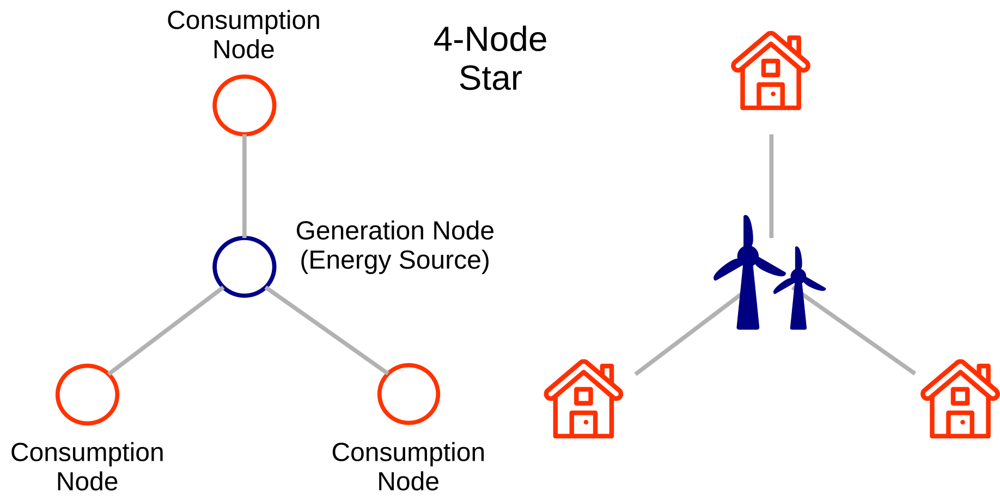

* *Predictive features*:
    * *'tau1' to 'tau4': the reaction time of each network participant, a real value within the range 0.5 to 10 ('tau1' corresponds to the supplier node, 'tau2' to 'tau4' to the consumer nodes)*
    * *'p1' to 'p4': nominal power produced (positive) or consumed (negative) by each network participant, a real value within the range -2.0 to -0.5 for consumers ('p2' to 'p4'). As the total power consumed equals the total power generated, p1 (supplier node) = - (p2 + p3 + p4)*
    * *'g1' to 'g4': price elasticity coefficient for each network participant, a real value within the range 0.05 to 1.00 ('g1' corresponds to the supplier node, 'g2' to 'g4' to the consumer nodes; 'g' stands for 'gamma')*

* Dependent variables:
    * *'stab': the maximum real part of the characteristic differentia equation root (if positive, the system is linearly unstable; if negative, linearly stable)*
    * *'stabf': a categorical (binary) label ('stable' or 'unstable').*

In [3]:
data.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 60000 entries, 0 to 59999

Data columns (total 14 columns):

 #   Column  Non-Null Count  Dtype  

---  ------  --------------  -----  

 0   tau1    60000 non-null  float64

 1   tau2    60000 non-null  float64

 2   tau3    60000 non-null  float64

 3   tau4    60000 non-null  float64

 4   p1      60000 non-null  float64

 5   p2      60000 non-null  float64

 6   p3      60000 non-null  float64

 7   p4      60000 non-null  float64

 8   g1      60000 non-null  float64

 9   g2      60000 non-null  float64

 10  g3      60000 non-null  float64

 11  g4      60000 non-null  float64

 12  stab    60000 non-null  float64

 13  stabf   60000 non-null  object 

dtypes: float64(13), object(1)

memory usage: 6.4+ MB


In [5]:
data.describe()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab
count,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000,60000.000000
mean,5.250000,5.250001,5.250001,5.250001,3.750000,-1.250000,-1.250000,-1.250000,0.525000,0.525000,0.525000,0.525000,0.015731
std,2.742434,2.742437,2.742437,2.742437,0.752129,0.433017,0.433017,0.433017,0.274244,0.274243,0.274243,0.274243,0.036917
min,0.500793,0.500141,0.500141,0.500141,1.582590,-1.999945,-1.999945,-1.999945,0.050009,0.050028,0.050028,0.050028,-0.080760
25%,2.874892,2.875011,2.875011,2.875011,3.218300,-1.624997,-1.624997,-1.624997,0.287521,0.287497,0.287497,0.287497,-0.015557
50%,5.250004,5.249981,5.249981,5.249981,3.751025,-1.249996,-1.249996,-1.249996,0.525009,0.525007,0.525007,0.525007,0.017142
75%,7.624690,7.624896,7.624896,7.624896,4.282420,-0.874993,-0.874993,-0.874993,0.762435,0.762490,0.762490,0.762490,0.044878
max,9.999469,9.999837,9.999837,9.999837,5.864418,-0.500025,-0.500025,-0.500025,0.999937,0.999982,0.999982,0.999982,0.109403


In [6]:
data.describe(include='object')

,stabf
count,60000
unique,2
top,unstable
freq,38280


In [7]:
data.isnull().any().any()

False

In [8]:
data.duplicated().any()

False

* *As there is a direct relationship between 'stab' and 'stabf' ('stabf' = 'stable' if 'stab' <= 0, 'unstable' otherwise), 'stab' will be dropped and 'stabf' will remain as the sole dependent variable.*

In [9]:
data.drop('stab',axis=1,inplace=True)

# EDA

In [10]:
data[['tau1','tau2','tau3','tau4']].describe()

,tau1,tau2,tau3,tau4
count,60000.000000,60000.000000,60000.000000,60000.000000
mean,5.250000,5.250001,5.250001,5.250001
std,2.742434,2.742437,2.742437,2.742437
min,0.500793,0.500141,0.500141,0.500141
25%,2.874892,2.875011,2.875011,2.875011
50%,5.250004,5.249981,5.249981,5.249981
75%,7.624690,7.624896,7.624896,7.624896
max,9.999469,9.999837,9.999837,9.999837


***Tau[2 to 4]** range from 0.500141 to 9.999837*

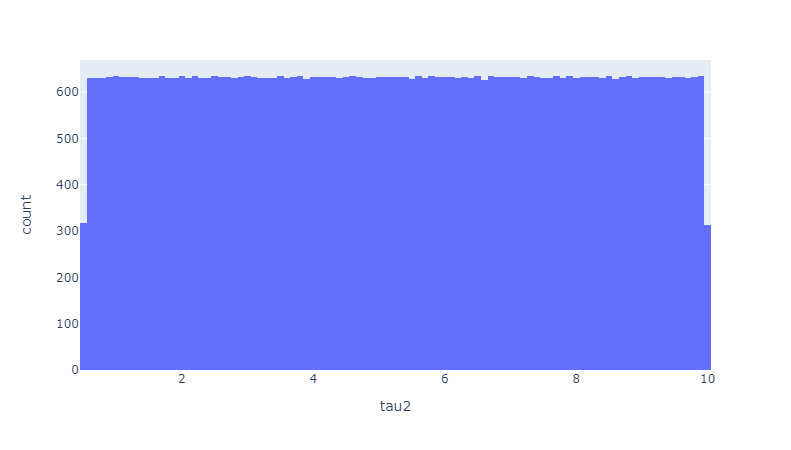

In [11]:
px.histogram(data,'tau2')

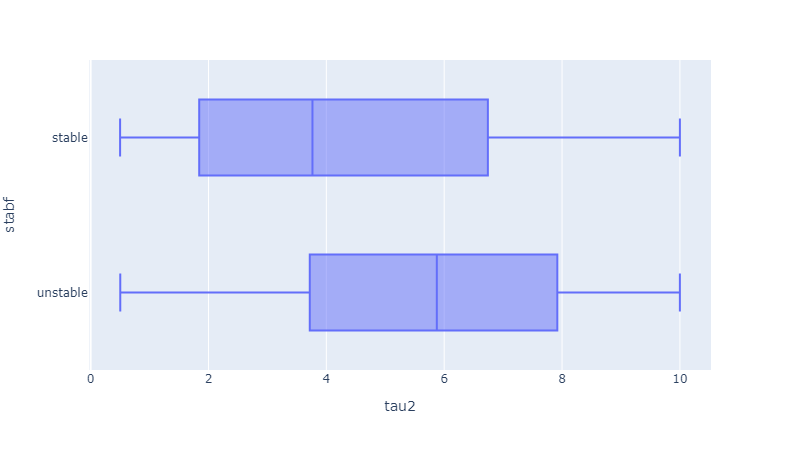

In [12]:
px.box(data,'tau2','stabf')

* Shorter reaction times are generally associated with more stable network behavior.
* This finding aligns with the idea that quicker responses to fluctuations can help the grid adjust and maintain balance more effectively, thus promoting stability.

In [13]:
data[['p1','p2','p3','p4']].describe()

,p1,p2,p3,p4
count,60000.000000,60000.000000,60000.000000,60000.000000
mean,3.750000,-1.250000,-1.250000,-1.250000
std,0.752129,0.433017,0.433017,0.433017
min,1.582590,-1.999945,-1.999945,-1.999945
25%,3.218300,-1.624997,-1.624997,-1.624997
50%,3.751025,-1.249996,-1.249996,-1.249996
75%,4.282420,-0.874993,-0.874993,-0.874993
max,5.864418,-0.500025,-0.500025,-0.500025


*Power consumed(**negative**), power produced(**positive**)*

* ***P1** has (positive values)*
* ***P[2 to 4]** range from -1.999945 to -0.500025 (negative values)*

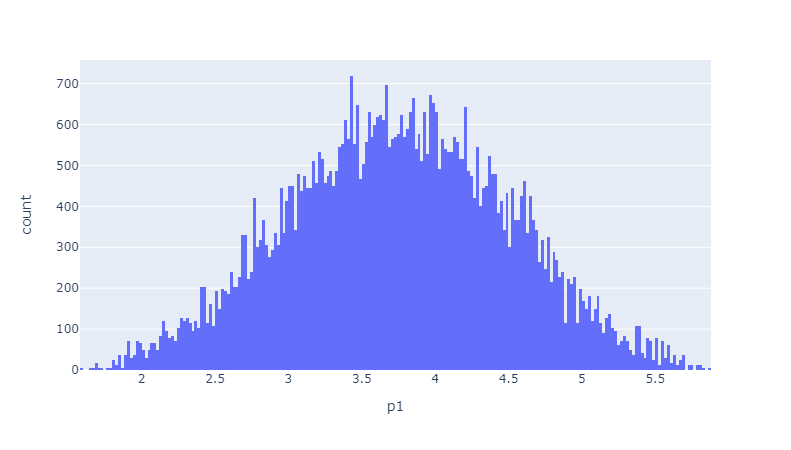

In [14]:
px.histogram(data,'p1')

***P1** normally distributed*

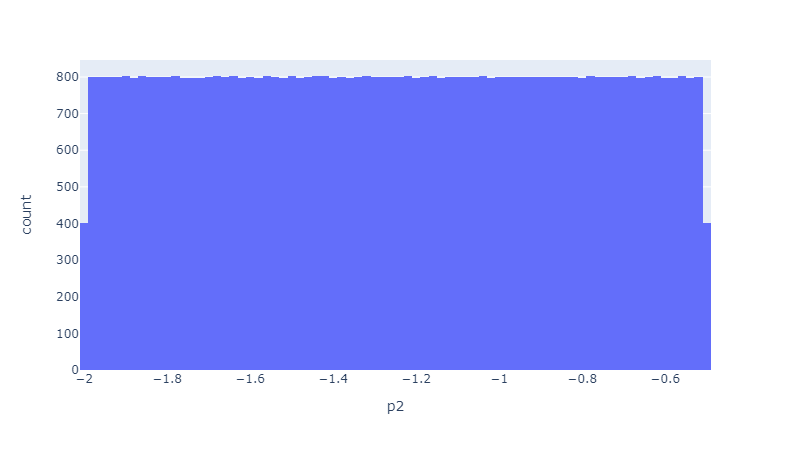

In [15]:
px.histogram(data,'p2')

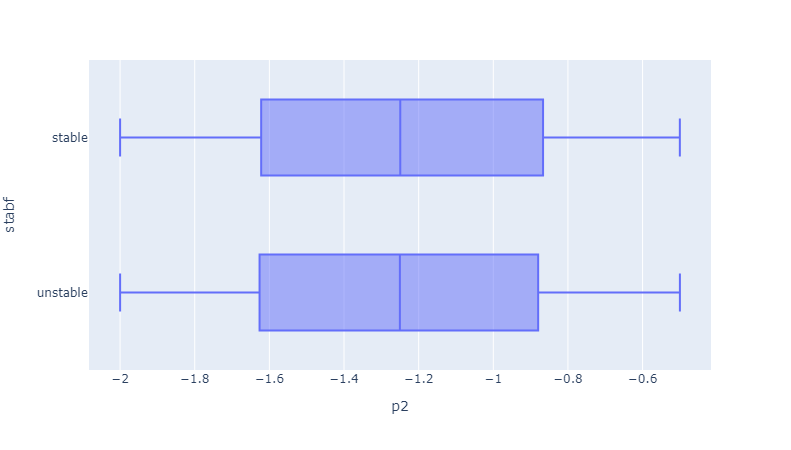

In [16]:
px.box(data,'p2','stabf')

* Stability of the grid is not necessarily influenced by how much power is being consumed

In [17]:
data[['g1','g2','g3','g4']].describe()

,g1,g2,g3,g4
count,60000.000000,60000.000000,60000.000000,60000.000000
mean,0.525000,0.525000,0.525000,0.525000
std,0.274244,0.274243,0.274243,0.274243
min,0.050009,0.050028,0.050028,0.050028
25%,0.287521,0.287497,0.287497,0.287497
50%,0.525009,0.525007,0.525007,0.525007
75%,0.762435,0.762490,0.762490,0.762490
max,0.999937,0.999982,0.999982,0.999982


* ***g[2 to 4]** range from 0.050028 to 0.999982*

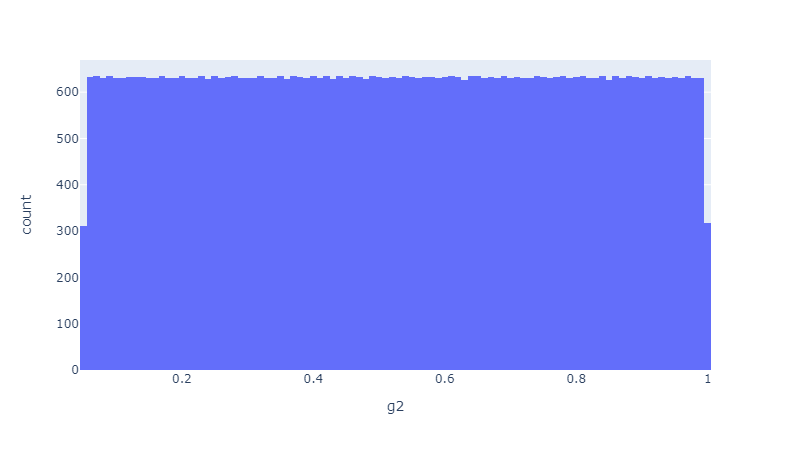

In [18]:
px.histogram(data,'g2')

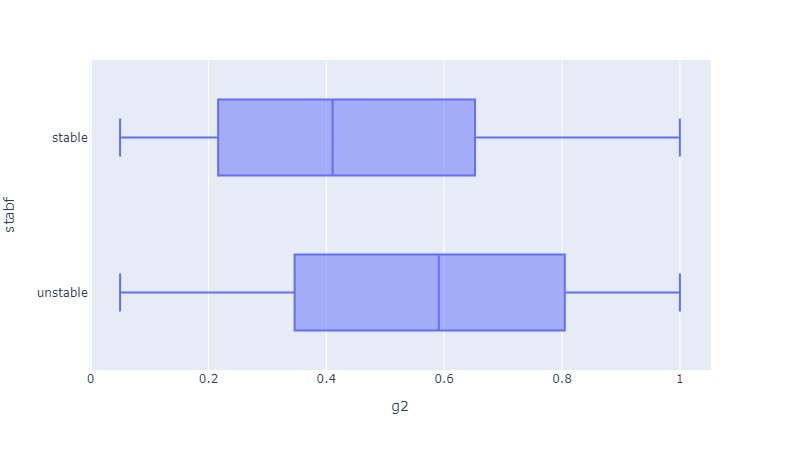

In [19]:
px.box(data,'g2','stabf')

* Lower price elasticity (smaller gamma) is associated with greater grid stability, as consumers' demand remains stable despite price fluctuations, making it easier for the grid to maintain balance.

In [20]:
data.stabf.value_counts()

stabf
unstable    38280
stable      21720
Name: count, dtype: int64

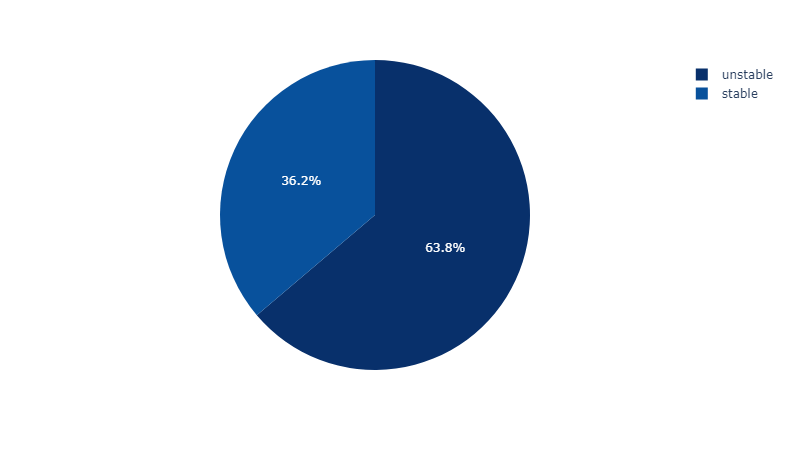

In [21]:
px.pie(data,'stabf',color_discrete_sequence=px.colors.sequential.Blues_r)

In [22]:
data.stabf.replace({'stable':1,'unstable':0},inplace=True)#encoding the stabf 

<Axes: >

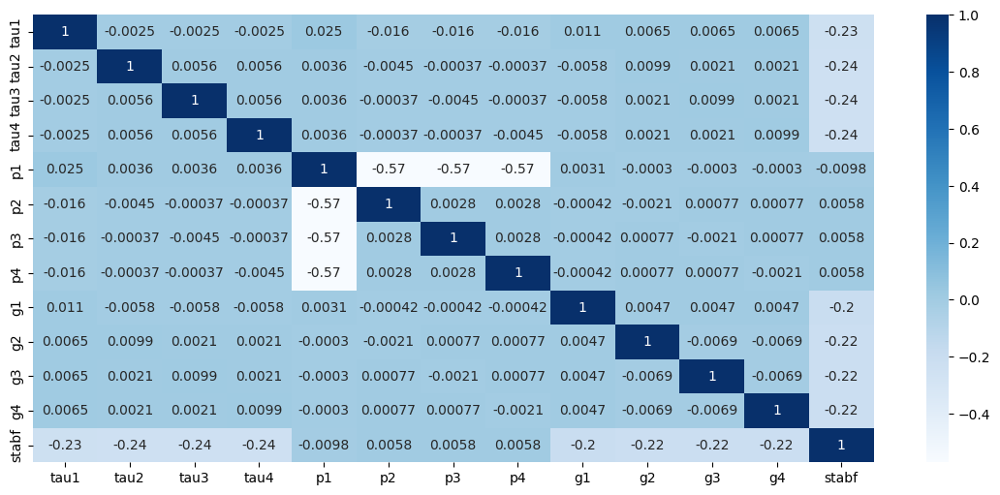

In [23]:
plt.figure(figsize=(14,6))
sns.heatmap(data.corr(method='spearman'),annot=True,cmap='Blues')

# Model

In [24]:
X = data.drop('stabf',axis=1)
y = data.stabf

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42,stratify=y)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train.shape, X_test.shape

((42000, 12), (18000, 12))

In [25]:
def build_model(hp):
    model = Sequential()
    # Input layer
    model.add(Input(shape=(12,)))
    # Tune the number of units in the first Dense layer
    model.add(Dense(units=hp.Int('units_1', min_value=32, max_value=128, step=32),
                    activation=hp.Choice('activation_1', values=['relu', 'tanh', 'elu']),
                    kernel_initializer=hp.Choice('init',values=['glorot_uniform','normal','glorot_normal'])))
    # Second Dense layer
    model.add(Dense(units=hp.Int('units_2', min_value=32, max_value=128, step=32),
                    activation=hp.Choice('activation_2', values=['relu', 'tanh', 'elu'])))
    # Output layer
    model.add(Dense(1, activation='sigmoid'))
    
    # Compile the model
    model.compile(optimizer=hp.Choice('optimizer', values=['adam', 'rmsprop', 'SGD']),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    
    return model


# Instantiate Keras Tuner's RandomSearch
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,  # Number of different hyperparameter combinations to try
    executions_per_trial=3,  # Number of models to train for each trial
    directory='project',
    project_name='smart_grid_stability'  # Directory to save the results
)

# Start the hyperparameter search
tuner.search(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Print the best hyperparameters
print(f"Best hyperparameters: {best_hps.values}")


Reloading Tuner from project\smart_grid_stability\tuner0.json

Best hyperparameters: {'units_1': 64, 'activation_1': 'elu', 'init': 'glorot_uniform', 'units_2': 64, 'activation_2': 'relu', 'optimizer': 'rmsprop'}


## Base model

Epoch 1/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7755 - loss: 0.4703 - val_accuracy: 0.8122 - val_loss: 0.3933

Epoch 2/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8126 - loss: 0.3939 - val_accuracy: 0.8124 - val_loss: 0.3912

Epoch 3/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8201 - loss: 0.3794 - val_accuracy: 0.8150 - val_loss: 0.3857

Epoch 4/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8203 - loss: 0.3773 - val_accuracy: 0.8203 - val_loss: 0.3757

Epoch 5/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.8264 - loss: 0.3681 - val_accuracy: 0.8318 - val_loss: 0.3578

Epoch 6/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8378 - loss: 0.3485 - val_accuracy: 0.8489 - val_loss: 0.3326

Epoch 7/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8543 - loss: 0.3174 - val_accuracy: 0.8639 - val_loss: 0.3033

Epoch 8/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8719 - 

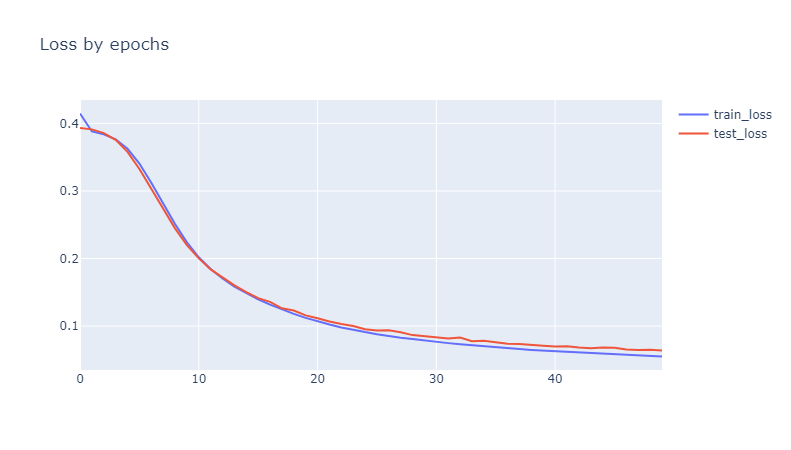

In [26]:
model = Sequential()
model.add(Input(shape=(12,)))
model.add(Dense(128, activation='tanh',kernel_initializer='glorot_uniform'))
model.add(Dense(64, activation='tanh'))
model.add(Dense(1, activation='sigmoid'))   

model.compile(optimizer='SGD', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1,validation_data=(X_test, y_test))


fig = go.Figure()
fig.add_trace(go.Scatter(y=history.history['loss'], mode='lines', name='train_loss'))
fig.add_trace(go.Scatter(y=history.history['val_loss'], mode='lines', name='test_loss'))
fig.update_layout(title='Loss by epochs')
fig.show()

563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 841us/step

              precision    recall  f1-score   support



           0       0.97      0.99      0.98     11484

           1       0.98      0.95      0.97      6516



    accuracy                           0.98     18000

   macro avg       0.98      0.97      0.97     18000

weighted avg       0.98      0.98      0.98     18000




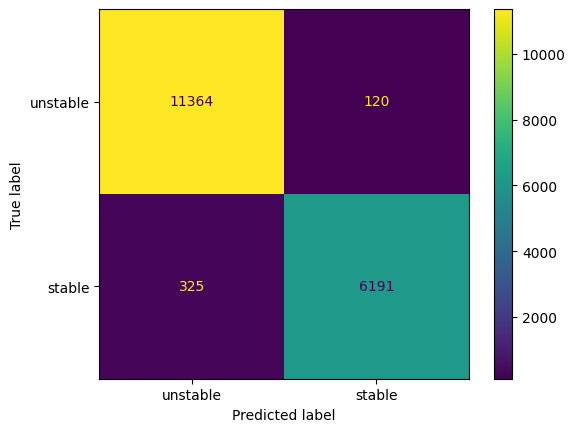

In [27]:
y_pred = model.predict(X_test)
y_pred = np.where(y_pred>0.5,1,0)
print(classification_report(y_test,y_pred))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['unstable','stable'])
disp.plot()

## Final model

Epoch 1/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.8545 - loss: 0.3246 - val_accuracy: 0.9207 - val_loss: 0.1850

Epoch 2/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9359 - loss: 0.1536 - val_accuracy: 0.9489 - val_loss: 0.1275

Epoch 3/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9561 - loss: 0.1128 - val_accuracy: 0.9546 - val_loss: 0.1093

Epoch 4/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9669 - loss: 0.0879 - val_accuracy: 0.9672 - val_loss: 0.0848

Epoch 5/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9696 - loss: 0.0766 - val_accuracy: 0.9663 - val_loss: 0.0833

Epoch 6/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9716 - loss: 0.0708 - val_accuracy: 0.9666 - val_loss: 0.0788

Epoch 7/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9737 - loss: 0.0641 - val_accuracy: 0.9720 - val_loss: 0.0672

Epoch 8/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9755 - 

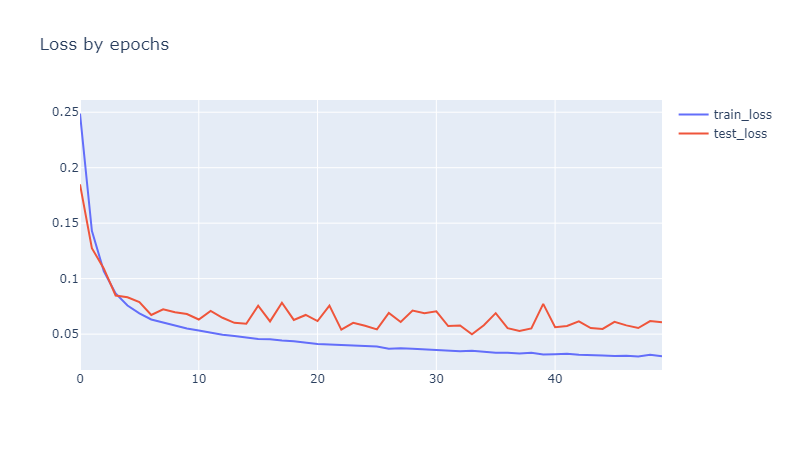

In [28]:
model = Sequential()
model.add(Input(shape=(12,)))
model.add(Dense(64, activation='elu',kernel_initializer='glorot_uniform'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))   

model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1,validation_data=(X_test, y_test))

fig = go.Figure()
fig.add_trace(go.Scatter(y=history.history['loss'], mode='lines', name='train_loss'))
fig.add_trace(go.Scatter(y=history.history['val_loss'], mode='lines', name='test_loss'))
fig.update_layout(title='Loss by epochs')
fig.show()

563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 827us/step

              precision    recall  f1-score   support



           0       0.99      0.98      0.98     11484

           1       0.96      0.98      0.97      6516



    accuracy                           0.98     18000

   macro avg       0.98      0.98      0.98     18000

weighted avg       0.98      0.98      0.98     18000




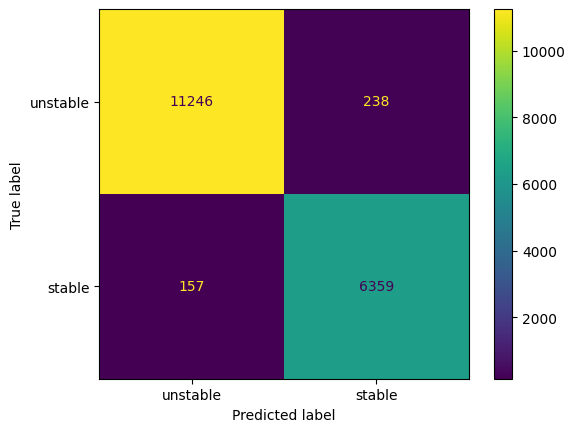

In [29]:
y_pred = model.predict(X_test)
y_pred = np.where(y_pred>0.5,1,0)
print(classification_report(y_test,y_pred))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['unstable','stable'])
disp.plot()

*There is a slight overfitting let's fix this ;D*

Epoch 1/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.7444 - loss: 0.5075 - val_accuracy: 0.8392 - val_loss: 0.3493

Epoch 2/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8490 - loss: 0.3335 - val_accuracy: 0.8681 - val_loss: 0.2957

Epoch 3/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8821 - loss: 0.2761 - val_accuracy: 0.8965 - val_loss: 0.2476

Epoch 4/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9046 - loss: 0.2307 - val_accuracy: 0.9133 - val_loss: 0.2126

Epoch 5/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9198 - loss: 0.1984 - val_accuracy: 0.9207 - val_loss: 0.1919

Epoch 6/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9278 - loss: 0.1788 - val_accuracy: 0.9276 - val_loss: 0.1741

Epoch 7/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9357 - loss: 0.1627 - val_accuracy: 0.9353 - val_loss: 0.1593

Epoch 8/50

1313/1313 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9409 - 

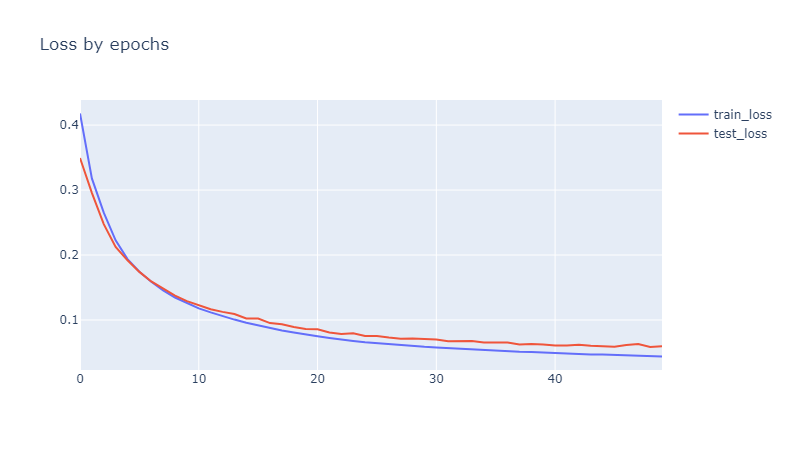

In [30]:
model = Sequential()
model.add(Input(shape=(12,)))
model.add(Dense(64, activation='elu',kernel_initializer='glorot_uniform'))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))   

model.compile(optimizer='SGD', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=50, batch_size=32, verbose=1,validation_data=(X_test, y_test))

fig = go.Figure()
fig.add_trace(go.Scatter(y=history.history['loss'], mode='lines', name='train_loss'))
fig.add_trace(go.Scatter(y=history.history['val_loss'], mode='lines', name='test_loss'))
fig.update_layout(title='Loss by epochs')
fig.show()

563/563 ━━━━━━━━━━━━━━━━━━━━ 1s 821us/step

              precision    recall  f1-score   support



           0       0.98      0.98      0.98     11484

           1       0.97      0.96      0.96      6516



    accuracy                           0.97     18000

   macro avg       0.97      0.97      0.97     18000

weighted avg       0.97      0.97      0.97     18000




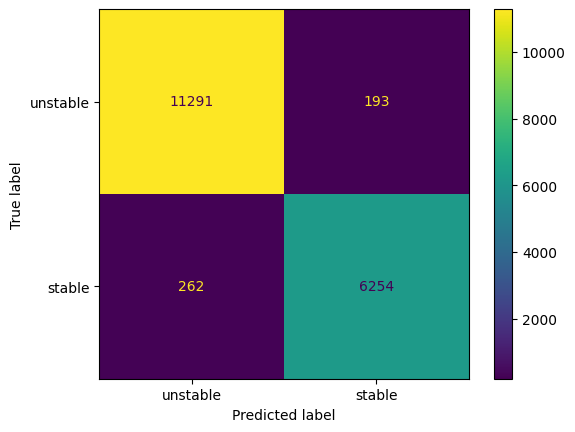

In [31]:
y_pred = model.predict(X_test)
y_pred = np.where(y_pred>0.5,1,0)
print(classification_report(y_test,y_pred))
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['unstable','stable'])
disp.plot()

***Fixed ;D***